# Motion

In [62]:
import cv2
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import mixture

## 3.1 Multi-resolution Lucas-Kanade optic flow detection

### Extract good points to track from ‘frame1.png’ using Harris corner detection algorithm. Use openCV function goodFeaturesToTrack and set parameter value maxCorners=500. Search optimal values for the rest of the parameters. Let us call the detected set of points: p1.

In [63]:
#read image 'frame1.png'
img1 = cv2.imread('frame1.png')


# convert to grayscale
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

# parameters for Harris corner detection
feature_params = dict( maxCorners = 500,
                       qualityLevel = 0.3,
                       minDistance = 7 ,
                       blockSize = 7,
                      mask = None,
                      useHarrisDetector = 1,
                      k = 0.04
                     )


# parameters for lucas kanade optical flow
lk_params = dict( winSize = (15,15),
                  maxLevel = 5,
                  criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT,
                             10, 0.03))

# find good corners in the first image
p0 = cv2.goodFeaturesToTrack(img1_gray, **feature_params)


### Compute the optical flow between ‘frame1.png’ and ‘frame2.png’ at the points in p1. Use the openCV function calcOpticalFlowPyrLK. Search for optimal values for the parameters.

In [64]:
#read image 'frame2.png'
img2 = cv2.imread('frame2.png')

#convert to grayscale
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# calculate optical flow
p1, st, err = cv2.calcOpticalFlowPyrLK(img1_gray, img2_gray, p0, None, **lk_params)

# select good points in old and new frames
good_new = p1[st==1]
good_old = p0[st==1]

# create some random colors
color = np.random.randint(0, 255, (good_new.shape[0], 3))

# create a mask image for drawing purposes
mask = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
#mask = np.zeros(img1.shape) #draw optical flow on black image

# draw the tracks
for i, (new, old) in enumerate(zip(good_new, good_old)):
    a, b = new.ravel()
    c, d = old.ravel()
    mask = cv2.line(mask, (a,b), (c,d), color[i].tolist(), 10)

### Display the optical flow image.

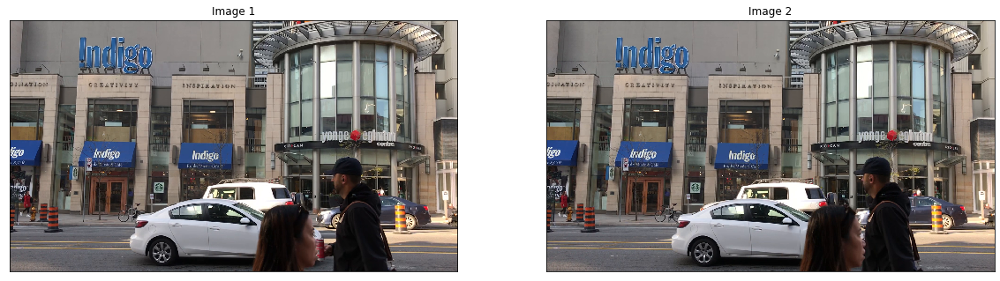

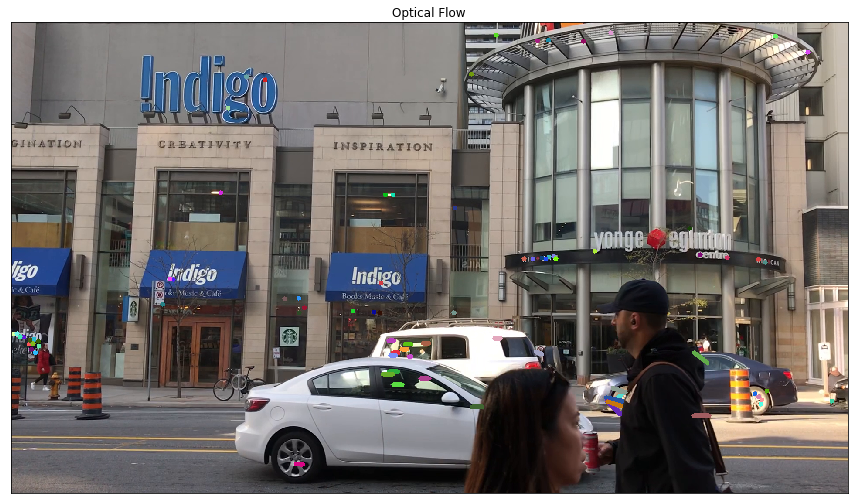

In [65]:
# display images
plt.figure(figsize=(20,20))
plt.subplot(121), plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title("Image 1"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.title("Image 2"), plt.xticks([]), plt.yticks([])
plt.figure(figsize=(15,15))
plt.imshow(mask)
plt.title("Optical Flow"), plt.xticks([]), plt.yticks([])
plt.show()

### Vary the maximum pyramid level from 0 to 10 in the function calcOpticalFlowPyrLK. For each setting, compute the mean of the error at those points whose correspondence search is successful i.e. returned status is 1. Plot the mean (on y-axis) vs. pyramid level (on x-axis). Discuss the trends you observe in the plot

[21.85589, 15.455327, 12.248078, 12.250666, 12.325353, 12.325257, 12.325218, 12.325218, 12.325218, 12.325218, 12.325218]


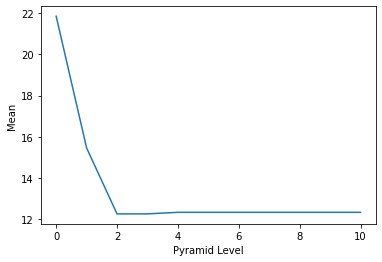

In [66]:
# documentation : " if the flow wasn’t found then the error is not defined (use the status parameter to find such cases)."
mean = []
p1_array = []
for i in range(0,11):
    # parameters for lucas kanade optical flow
    lk_params = dict( winSize = (15,15),
                      maxLevel = i,
                      criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT,
                                 10, 0.03))

    # find good corners in the first image
    p0 = cv2.goodFeaturesToTrack(img1_gray, **feature_params)
    
    # calculate optical flow
    p1, st, err = cv2.calcOpticalFlowPyrLK(img1_gray, img2_gray, p0, None, **lk_params)
    p1_array.append(p1)
    mean.append(np.mean(err))

print(mean)
plt.plot(np.arange(0,11), mean)
plt.xlabel('Pyramid Level'), plt.ylabel('Mean')
plt.show()
    
    
    
    


The mean of the error decreases until a pyramid level of 2 where it stays constant all the way to 10. I tried to increase the pyramid level and it stays constant all the way, it does not decrease. 

### Display the optical flow for each setting of maximum pyramid level. Comment on the quality of the results.

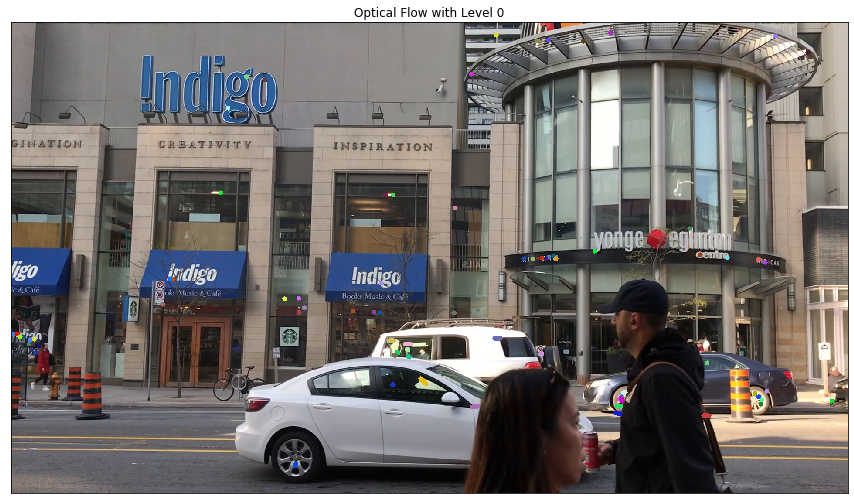

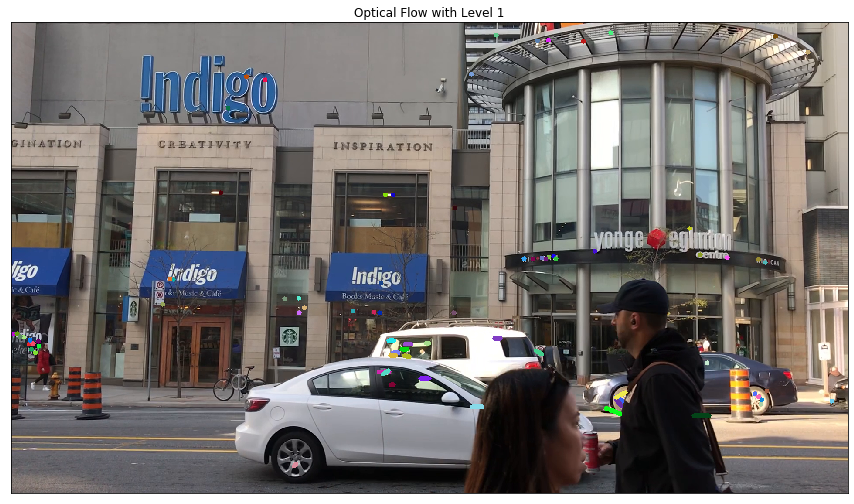

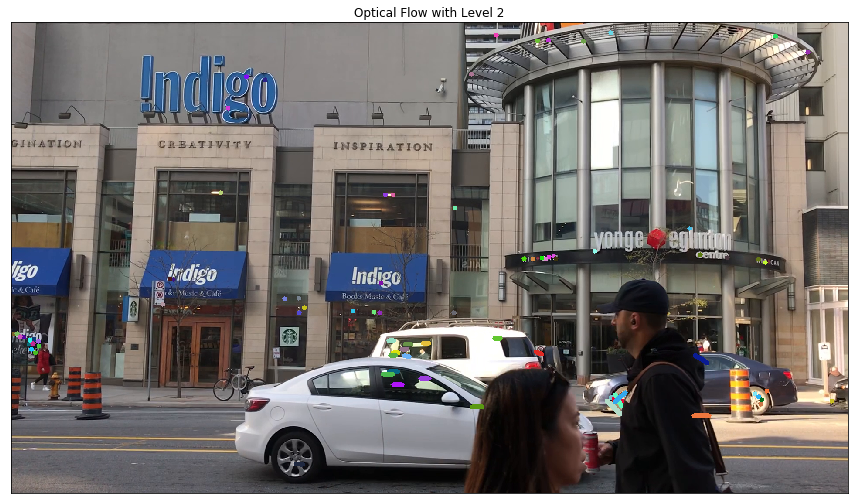

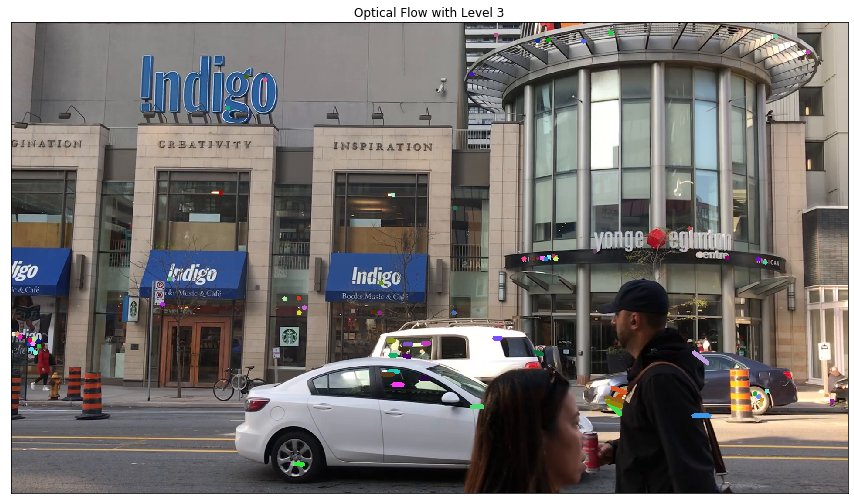

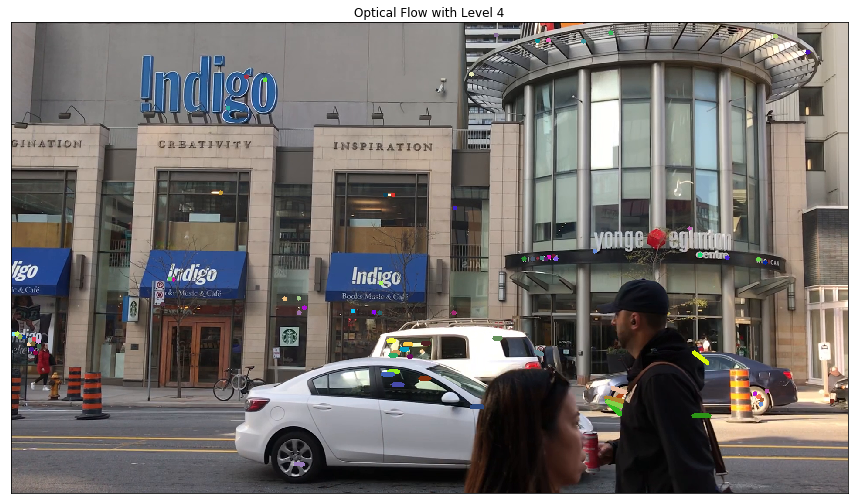

...

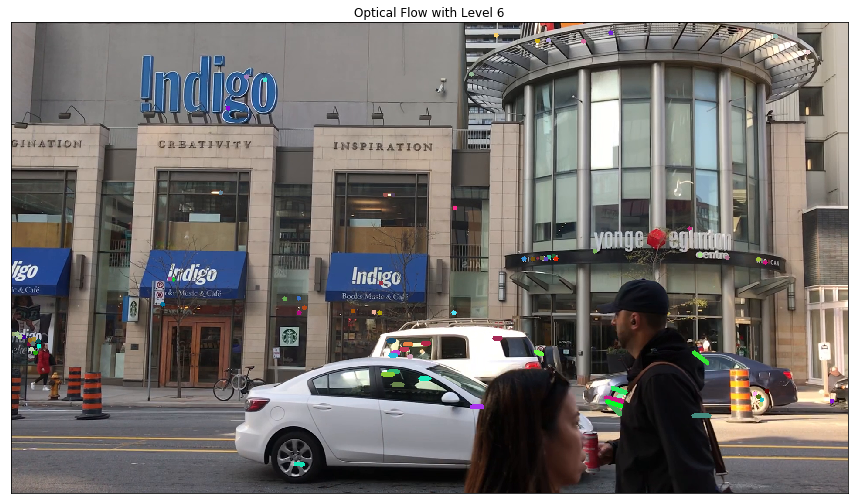

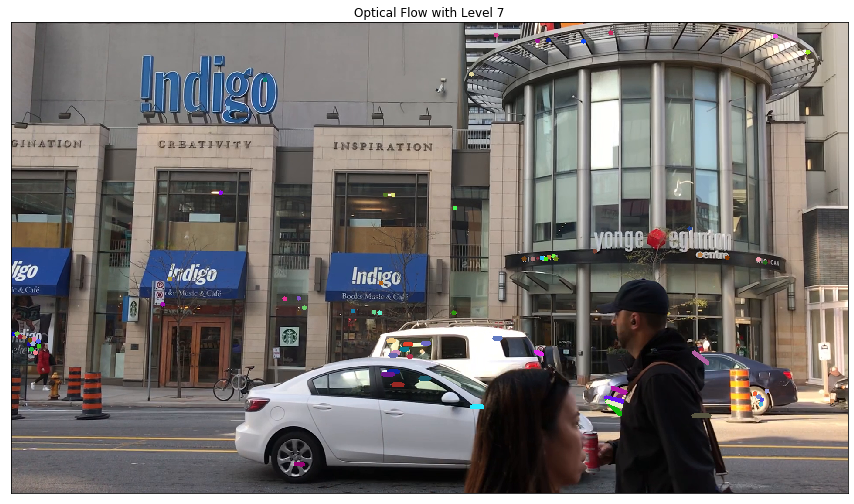

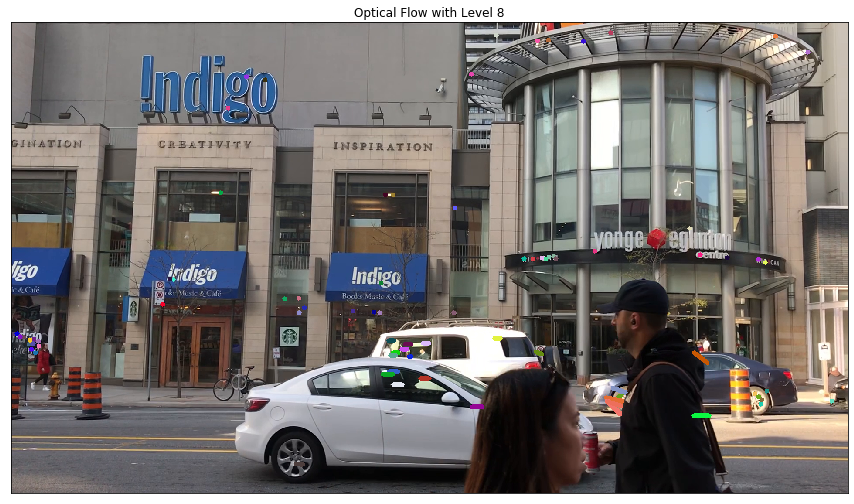

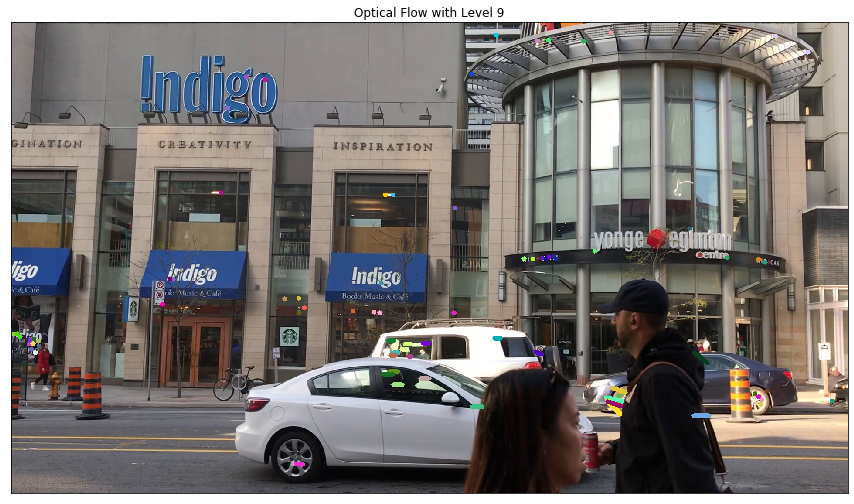

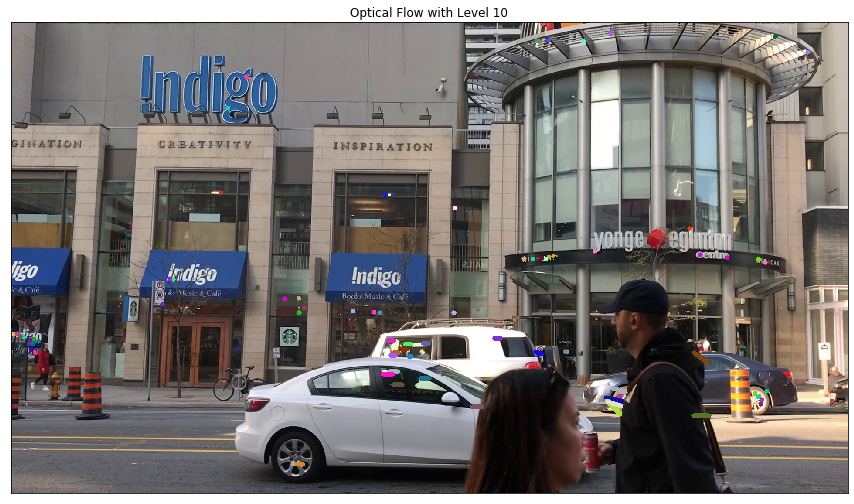

In [67]:
for j in range(11):
    # select good points in old and new frames
    good_new = p1_array[j][st==1]
    good_old = p0[st==1]

    # create some random colors
    color = np.random.randint(0, 255, (good_new.shape[0], 3))

    # create a mask image for drawing purposes
    mask = img1.copy()

    # draw the tracks
    for i, (new, old) in enumerate(zip(good_new, good_old)):
        a, b = new.ravel()
        c, d = old.ravel()
        mask = cv2.line(mask, (a,b), (c,d), color[i].tolist(), 10)
    
    #display image with optical flow
    plt.figure(figsize=(15,15))
    plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
    plt.title("Optical Flow with Level " + str(j)), plt.xticks([]), plt.yticks([])
    plt.show()
    

The optical flow lines are more and more accurate from 0 to 2 then the lines are almost similar all the way to the end. It is following the trend of the plot above.